In [1]:
## IMPORTANT !

# In the first order need to set the number of CPU 
# for calculation before launching (depends on computer's number of cores)
n_jobs= 30

#libraries
import pandas as pd
import numpy as np
import os
import sys
import shutil
import glob
import joblib
import warnings
from datetime import date, datetime

from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import LeavePGroupsOut
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import pearsonr
import scipy.stats as st

from nilearn import image as nli
from nilearn import plotting

import copy

In [2]:
#@title Import functions
%matplotlib inline  
#!pip install brainspace --quiet
import ipywidgets as widgets  

# Interactive plots
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets # interactive display
my_layout = widgets.Layout()

import numpy as np
from brainspace.datasets import load_conte69
from brainspace.plotting import plot_hemispheres, plot_surf
from brainspace.utils.parcellation import map_to_labels
from brainspace.mesh import mesh_cluster
import panel as pn
pn.extension('vtk')
import os # OS to handle paths
import pandas as pd # pandas for data framse
import csv
import urllib.request as urllib2

import matplotlib.pyplot as plt # For changing the color maps
from matplotlib import cm # cm=colormap
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# from hcp_regions import HCPRegions
import ipywidgets as widgets       # interactive display

from brainspace.datasets import load_fsa5
from nilearn import datasets
from brainspace.utils.parcellation import reduce_by_labels

##### Load data

In [3]:
#load path to orig tables
path='/media/data/Dunedin_Study_Data_Narun_P_Jan2022/MLTabs/'

In [4]:
path_img_out = '/media/hcs-psy-narun/Alina/HCP_results/predicted_values_for_datasets_4/plots_article/plots_feat_dud45/'

In [5]:
#load some features tables as dictionary
features = {
    'facename':pd.read_csv(path+'facename.csv', index_col=0),
    'surf':pd.read_csv(path+'cort_area.csv', index_col=0),
    'subc':pd.read_csv(path+'subc_vol.csv', index_col=0),
    'brainVol':pd.read_csv(path+'total_vol.csv', index_col=0),
    
    'rest':pd.read_csv(path+'rest.csv', index_col=0) 

}

In [6]:
#load labels from orig tables
ind_task = features['facename'].columns.values
ind_anat = features['surf'].columns.values
ind_subc = features['subc'].columns.values
ind_bVol = features['brainVol'].columns.values
ind_FC = features['rest'].columns.values

In [7]:
#path to ML outputs
nmf=path+'output_newADJ_OneTrain_stackSTD_5cv_SHAP_new_fsiq45'
path2 = nmf+'/'

#read number of folds
folders = sorted((os.listdir(path2)))[:1]
print(path2)
print(folders)

/media/data/Dunedin_Study_Data_Narun_P_Jan2022/MLTabs/output_newADJ_OneTrain_stackSTD_5cv_SHAP_new_fsiq45/
['Fold_0']


##### Labels

In [8]:
#Labels
#labels for single modalities and stack
lblY = ['Total Brain Volume',
         'Cortical Thickness',    
         'Facename: Encoding-Distractor',    
         'Facename FC',    
         'Emotion Processing Contrast', 
         'Emotion Processing FC', 
         'MID Contrast', 
         'MID FC', 
         'Resting State FC',  
         'Stroop Contrast',
         'Stroop FC',
         'Subcortical Volume',
         'Surface Area',
        'Stacked: All', #set1
        'Stacked: Task Contrast', #set2
        'Stacked: Non Task', #set3
        'Stacked: Task FC', #set4
        'Stacked: Task Contrast & FC', #set5
        'Stacked: All excluding Task FC', #set6  with Task GLM
        'Stacked: All excluding Task Contrast',  #set7 with Task FC
        'Stacked: Resting and Task FC'] #set8

#labels for single modalities within each stack
lbl_set1 = ['stroop', 'faces', 'facename', 'mid', 
            'stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC', 
            'cort', 'surf', 'subc', 'rest', 'brainVol']
lbl_set2 = ['stroop', 'faces', 'facename', 'mid']
lbl_set3 = ['cort', 'surf', 'subc','brainVol', 'rest']
lbl_set4 = ['stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC']
lbl_set5 = ['stroop', 'faces', 'facename', 'mid', 'stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC']
lbl_set6 = ['stroop', 'faces', 'facename', 'mid', 'cort', 'surf', 'subc','brainVol', 'rest']
lbl_set7 = ['stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC', 'cort', 'surf', 'subc','brainVol', 'rest']
lbl_set8 = ['stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC', 'rest']

##### Extract feature importance 

In [9]:
#extract feature importance from saved models

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

dct_stack_coeff={} #empty dct to store 

nsets = ['set1', 'set2', 'set3', 'set4', 'set5', 'set6', 'set7', 'set8']
lblssets = [lbl_set1, lbl_set2, lbl_set3, lbl_set4, lbl_set5, lbl_set6, lbl_set7, lbl_set8]

for nset, lblsset in zip(nsets, lblssets):
    dct_ = {}
    #extracting feature importance for each fold and each stack model
    for fold in folders:
        dct_[fold] = (joblib.load(path2+fold+'/'+nset+'_stacked_model.sav')).named_steps['elasticnet'].coef_
    df = pd.DataFrame(dct_ , index=lblsset).T 
    #save as separate table
    df.to_csv(path2+nset+'_stacked_coeffs.csv') 
    #save to dictionary
    dct_stack_coeff[nset] = df

In [10]:
#print mean feature importance for each stack before plotting

for key in dct_stack_coeff.keys():
    print(key)
    display(dct_stack_coeff[key].mean().sort_values(ascending=False))
    print(' ')

set1


facename       0.263864
stroop         0.177924
rest           0.163654
surf           0.149039
faces          0.145137
cort           0.134613
mid_FC         0.073773
mid            0.073662
subc           0.056858
stroop_FC      0.042880
facename_FC    0.032614
faces_FC       0.022288
brainVol      -0.118564
dtype: float64

 
set2


facename    0.339265
faces       0.243686
stroop      0.217986
mid         0.123810
dtype: float64

 
set3


rest        0.334455
cort        0.252409
surf        0.236296
subc        0.097448
brainVol   -0.126628
dtype: float64

 
set4


facename_FC    0.199874
mid_FC         0.198987
stroop_FC      0.182432
faces_FC       0.124671
dtype: float64

 
set5


facename       0.289135
stroop         0.199092
faces          0.181948
mid_FC         0.119343
mid            0.085428
stroop_FC      0.079978
faces_FC       0.060307
facename_FC    0.057995
dtype: float64

 
set6


facename    0.284027
rest        0.202998
stroop      0.183424
faces       0.165869
surf        0.155754
cort        0.142867
mid         0.089275
subc        0.067814
brainVol   -0.117971
dtype: float64

 
set7


rest           0.208754
cort           0.207676
surf           0.200598
facename_FC    0.139575
mid_FC         0.120172
stroop_FC      0.110780
subc           0.063812
faces_FC       0.058182
brainVol      -0.124376
dtype: float64

 
set8


rest           0.247358
facename_FC    0.172514
mid_FC         0.149760
stroop_FC      0.137405
faces_FC       0.083304
dtype: float64

##### Plot stacked models

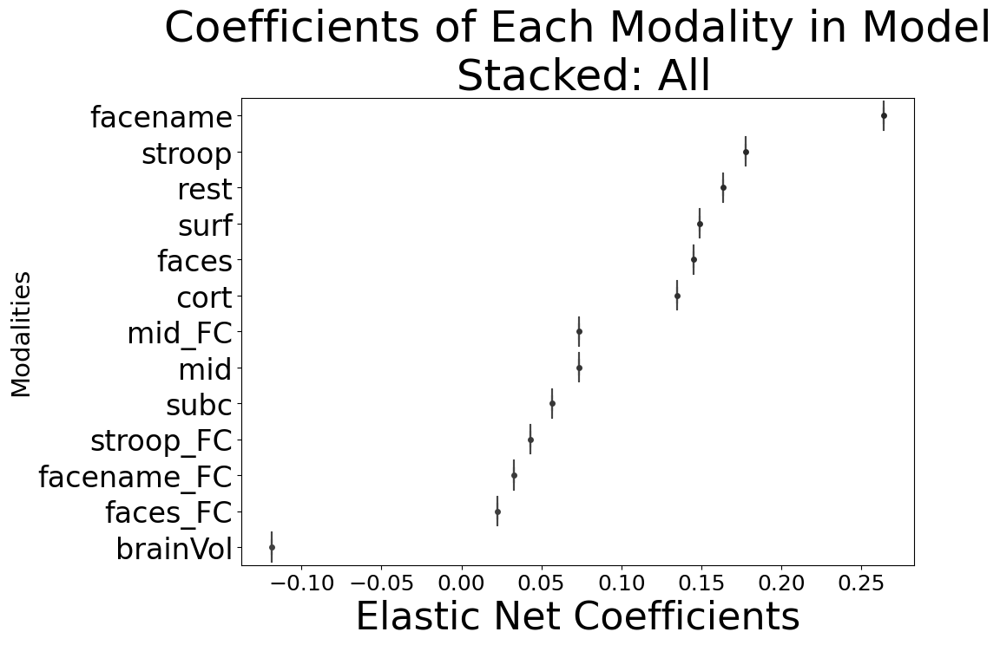

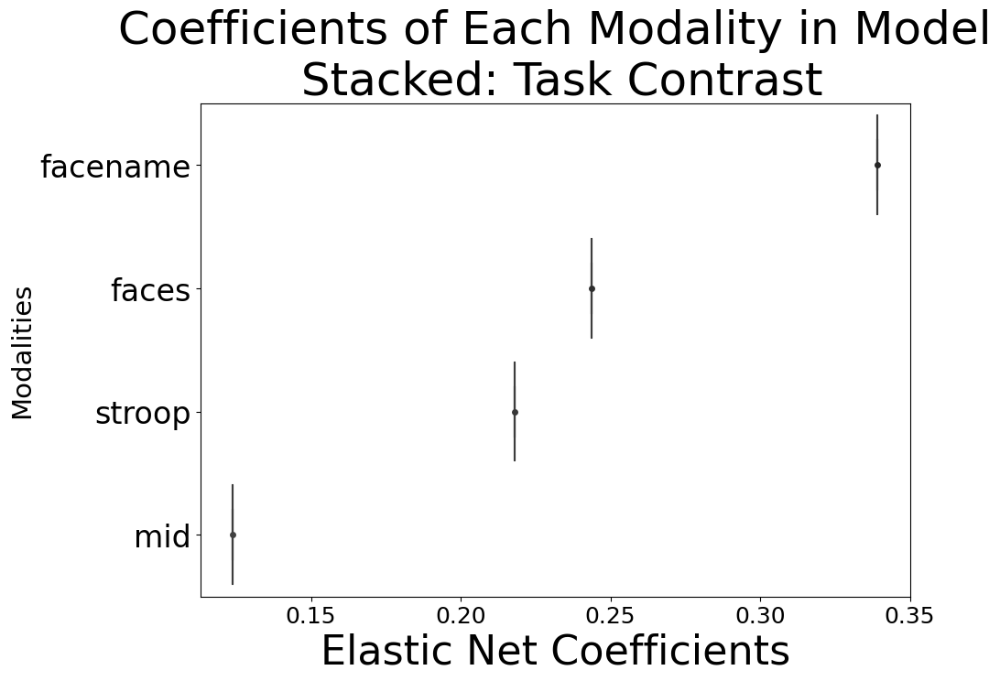

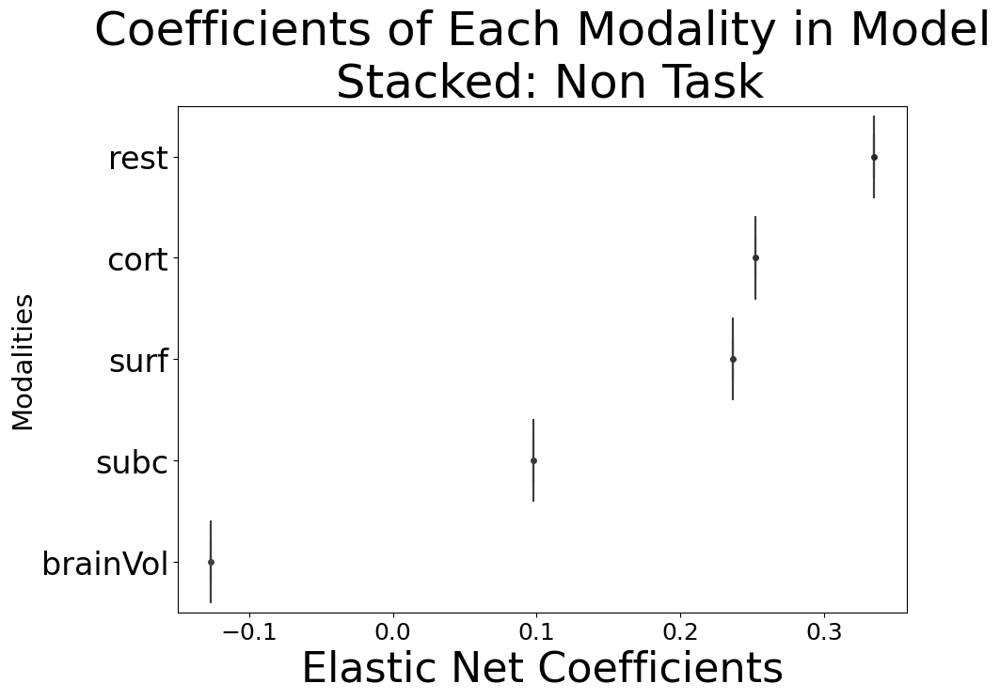

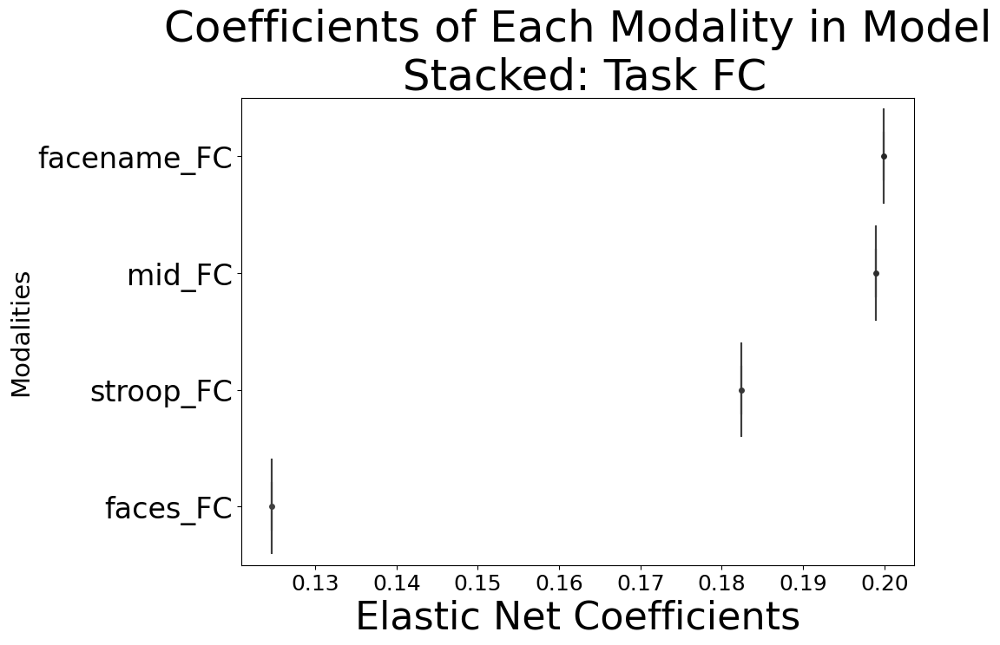

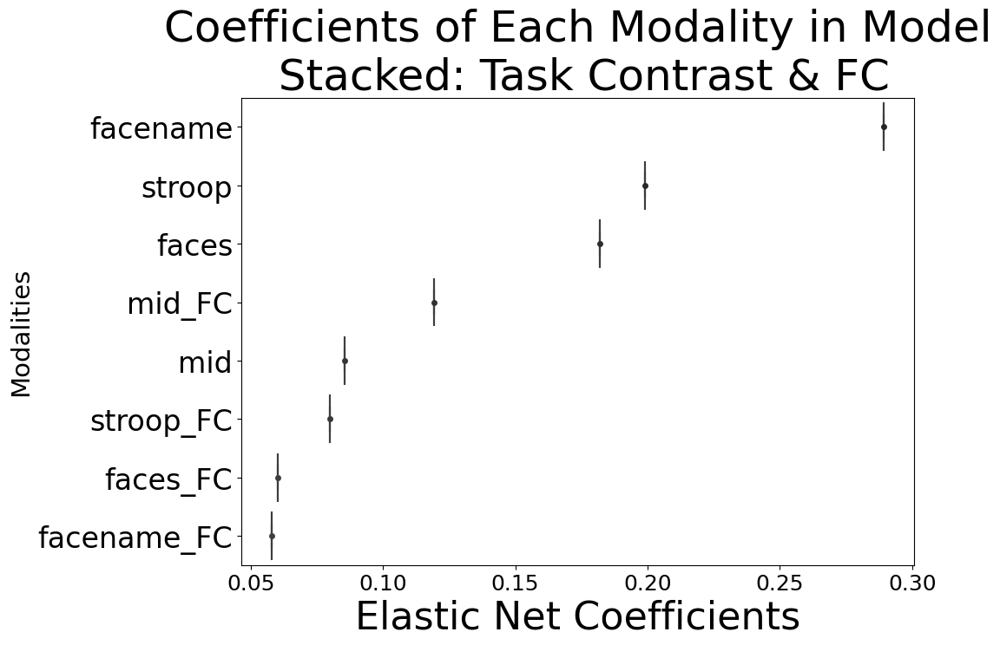

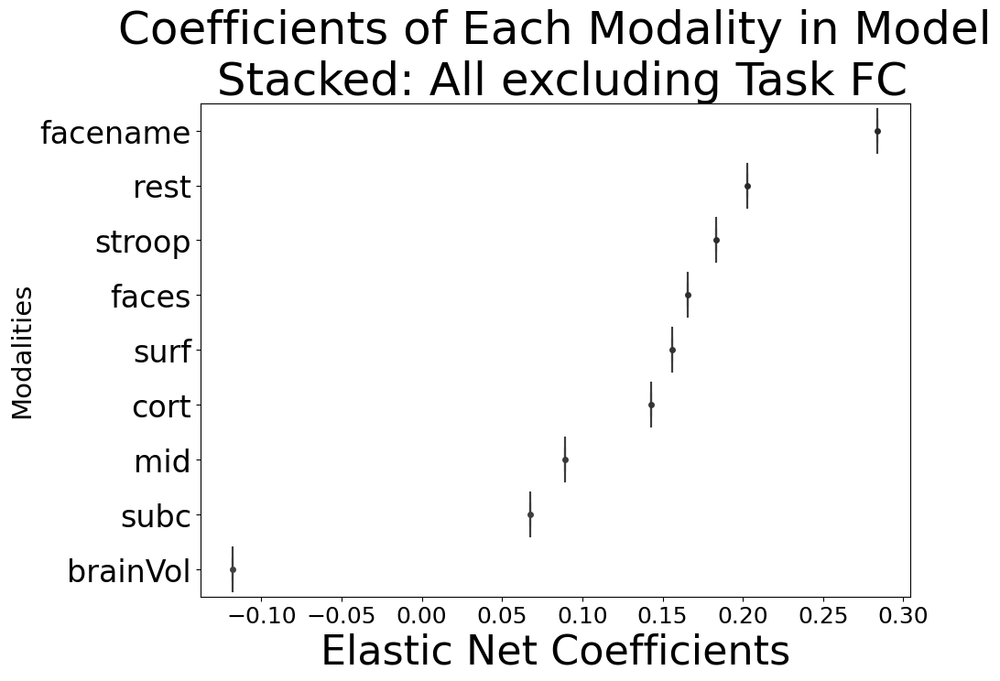

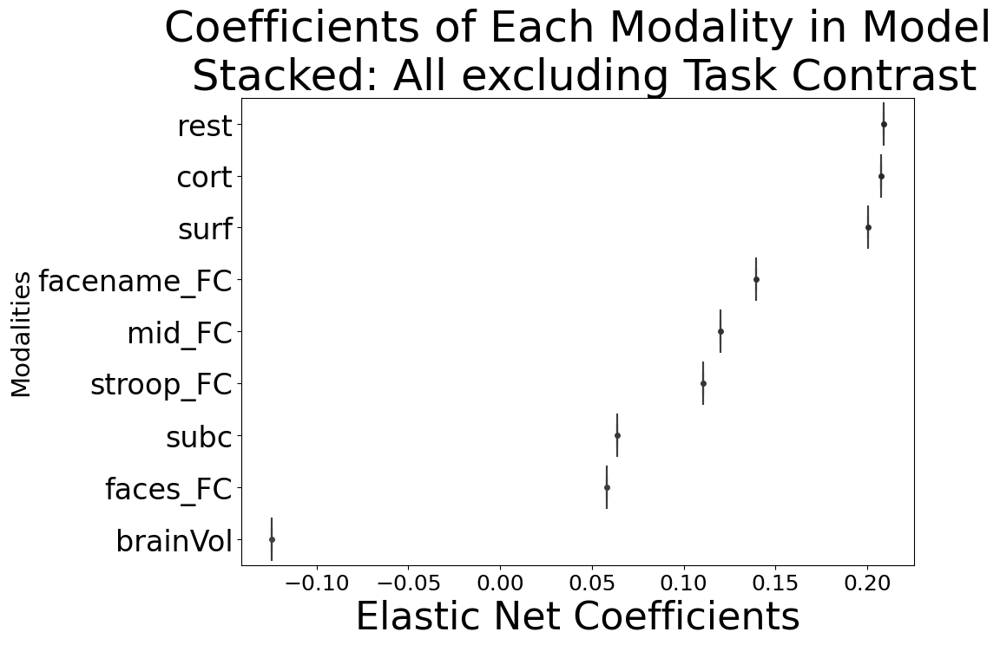

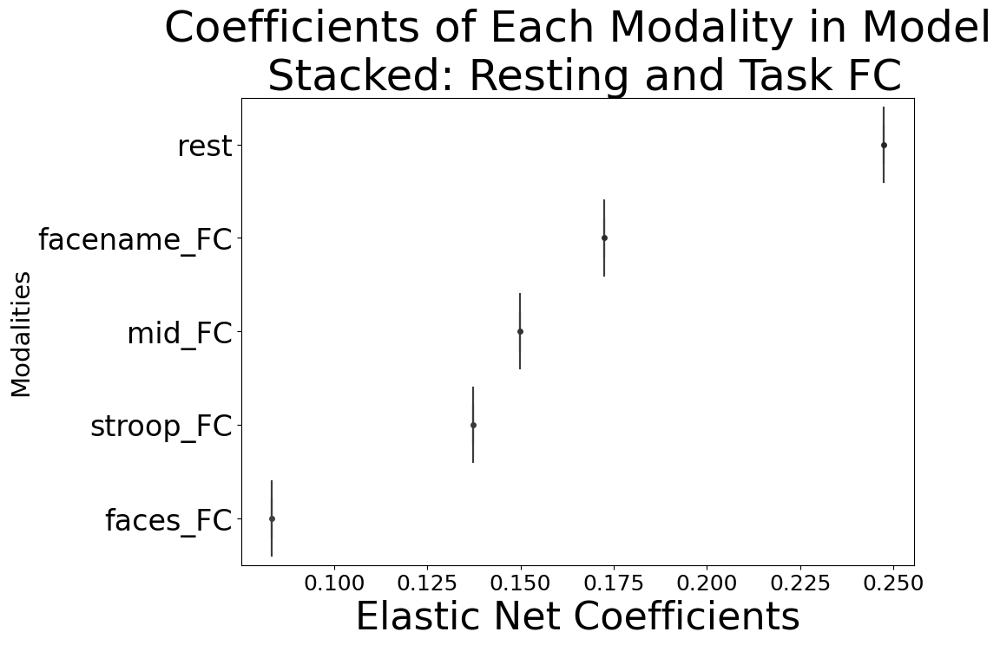

In [11]:
#plot stacked model coeffs 

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

for key, label in zip(dct_stack_coeff.keys(), lblY[-8:]):
    d=dct_stack_coeff[key].reindex(columns = dct_stack_coeff[key].mean().sort_values(ascending=False).index)

    plt.figure(figsize=(10,7))

    sns.boxplot(data=d, orient="h")
    sns.swarmplot(data=d, color=".25", orient="h")

    plt.xticks(fontsize=18) 
    plt.yticks(fontsize=24)
    plt.xlabel('Elastic Net Coefficients', fontsize=32)
    plt.ylabel('Modalities', fontsize=21)
    plt.title('Coefficients of Each Modality in Model\n '+label ,fontsize=36)

    plt.show()

In [12]:
###Feature coefficients for stacked modality models

In [13]:
dct_mean_stack_coef = {}
for key in list(dct_stack_coeff.keys()):
    dct_mean_stack_coef[key] = dct_stack_coeff[key].mean()

df_mean_stack_coef = pd.DataFrame(dct_mean_stack_coef)
#df_mean_stack_coef = df_mean_stack_coef.reindex(index = dct_mean_stack_coef['set1'].index)

In [14]:
df_mean_stack_coef

,set1,set2,set3,set4,set5,set6,set7,set8
brainVol,-0.118564,NaN,-0.126628,NaN,NaN,-0.117971,-0.124376,NaN
cort,0.134613,NaN,0.252409,NaN,NaN,0.142867,0.207676,NaN
facename,0.263864,0.339265,NaN,NaN,0.289135,0.284027,NaN,NaN
facename_FC,0.032614,NaN,NaN,0.199874,0.057995,NaN,0.139575,0.172514
faces,0.145137,0.243686,NaN,NaN,0.181948,0.165869,NaN,NaN
faces_FC,0.022288,NaN,NaN,0.124671,0.060307,NaN,0.058182,0.083304
mid,0.073662,0.123810,NaN,NaN,0.085428,0.089275,NaN,NaN
mid_FC,0.073773,NaN,NaN,0.198987,0.119343,NaN,0.120172,0.149760
rest,0.163654,NaN,0.334455,NaN,NaN,0.202998,0.208754,0.247358
stroop,0.177924,0.217986,NaN,NaN,0.199092,0.183424,NaN,NaN


In [15]:
sorted(pd.DataFrame(dct_mean_stack_coef).index)

['brainVol',
 'cort',
 'facename',
 'facename_FC',
 'faces',
 'faces_FC',
 'mid',
 'mid_FC',
 'rest',
 'stroop',
 'stroop_FC',
 'subc',
 'surf']

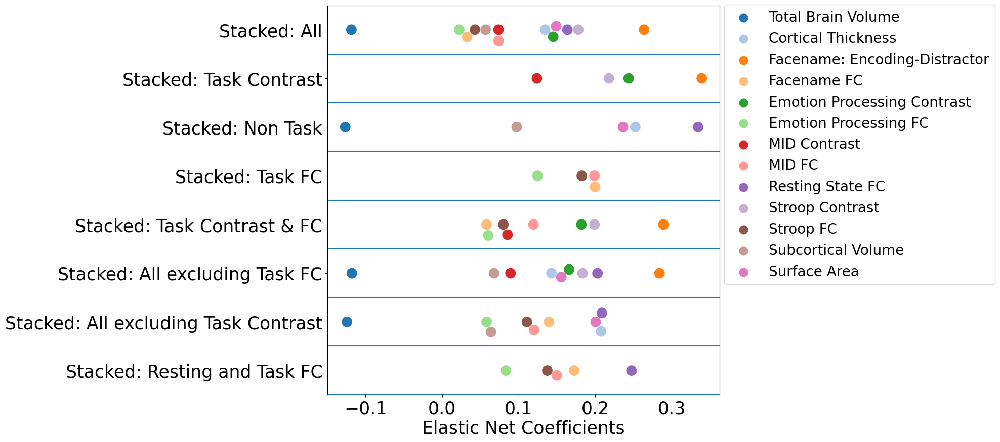

In [18]:
#Plot stacked model coefficients in different way


dct_mean_stack_coef = {}
for key in list(dct_stack_coeff.keys()):
    dct_mean_stack_coef[key] = dct_stack_coeff[key].mean()

df_mean_stack_coef = pd.DataFrame(dct_mean_stack_coef)
df_mean_stack_coef = df_mean_stack_coef.reindex(index = sorted(pd.DataFrame(dct_mean_stack_coef).index))
df_mean_stack_coef.index = lblY[:-8] 
df_mean_stack_coef.columns = lblY[-8:]

#reshape
df_plot_ = pd.DataFrame()
for col in df_mean_stack_coef.columns:
    vct = df_mean_stack_coef[col].values
    ind = df_mean_stack_coef[col].index
    sst = np.full(len(ind), col)
    df__ = pd.DataFrame({'val':vct, 'mod':ind, 'set':sst})
    df_plot_ = pd.concat([df_plot_, df__], axis=0, ignore_index=True)
    
#plot
plt.figure(figsize=(10,10))
sns.swarmplot(data=df_plot_, x='val', y='set', hue='mod', orient="h", 
              palette="tab20", size=15)
for i in np.arange(0.5,8.5,1):
    plt.axhline(y=i)
plt.legend(loc='upper right', bbox_to_anchor=(1.72,1.02), fontsize=20, markerscale=2)
plt.xlabel('Elastic Net Coefficients', fontsize=25)
plt.ylabel('')
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)

plt.savefig(path_img_out+'feat_stack_plot_image.svg',bbox_inches='tight')

plt.show()

##### Extract feature importance for single modality models

In [15]:
###Feature coefficients for single modality models

In [16]:
#extract feature importance from saved models

#for single modalities (except functional connectivities)


dct_elnet_coeff={}

for file in [i.split('/')[-1] for i in sorted(glob.glob(path2+fold+'/*_elnet_model.sav'))]:
    
    if ('_FC_' not in file) and ('rest' not in file):
        
        dct_ = {}
        #extracting feature importance for each fold each modality
        for fold in folders:
            dct_[fold] = (joblib.load(path2+fold+'/'+file)).named_steps['elasticnet'].coef_
        #assign appropriate indexes
        if file.split('_')[0] in ['stroop', 'faces', 'facename', 'mid']:
            indxs = ind_task
        elif file.split('_')[0] in ['cort', 'surf']:
            indxs = ind_anat
        elif file.split('_')[0] in ['subc']:
            indxs = ind_subc
        elif file.split('_')[0] in ['brainVol']:    
            indxs = ind_bVol   
            
        df = pd.DataFrame(dct_ , index=indxs).T 
        #save as csv table
        df.to_csv(path2+file.split('_')[0]+'_elnet_coeffs.csv')
        #save to dictionary
        dct_elnet_coeff[file.split('_')[0]] = df

In [17]:
#extract feature importance from saved models

#for single modalities, only functional connectivities


dct_elnet_FC_coeff={}

for file in [i.split('/')[-1] for i in sorted(glob.glob(path2+fold+'/*_elnet_model.sav'))]:
    
    if ('_FC_' in file) or ('rest'  in file):
        
        dct_ = {}
        #assign appropriate indexes
        indxs = ind_FC
        colsx = np.arange(1,76,1)
        #extracting feature importance for each fold each modality
        for fold in folders:
            #extract PCA values (~71000 of ROI pairs into 75 pc)
            pca_model_ind = np.absolute(((joblib.load(path2+fold+'/PCA_models/PCA_model.sav'))[file.replace("_elnet_model.sav", '')]).components_)
            #extract ElasticNet values for 75 pc
            pc_inx = (joblib.load(path2+fold+'/'+file)).named_steps['elasticnet'].coef_
            #multiply PCA values with ElNet values, and summarize across 75 pc for each ROI pair, for one fold
            dct_[fold] = pd.DataFrame( pca_model_ind.T * pc_inx , index = indxs, columns = colsx).T.sum()  
            
        df = pd.DataFrame(dct_).T
        #save as csv table
        df.to_csv(path2+file.replace("_elnet_model.sav", '')+'_elnet_coeffs.csv')
        #save to dictionary
        dct_elnet_FC_coeff[file.replace("_elnet_model.sav", '')] = df

##### Plotting single modality feature importances

##### check numbers

In [19]:
dct_elnet_coeff.keys()

dict_keys(['brainVol', 'cort', 'facename', 'faces', 'mid', 'stroop', 'subc', 'surf'])

In [20]:
task_keys = ['facename', 'faces', 'mid', 'stroop']
anat_keys = ['cort', 'surf']

In [21]:
for tkey in task_keys:
    print( tkey,min(dct_elnet_coeff[tkey].mean()[:360]), max(dct_elnet_coeff[tkey].mean()[:360]))

facename -0.029192508188727644 0.030407480549756314
faces -0.02489560563569509 0.0339840905782893
mid -0.041034639734865 0.03854737968709581
stroop -0.05704460983650144 0.07503147088708267


##### Plot on brain surface

##### Task contrasts

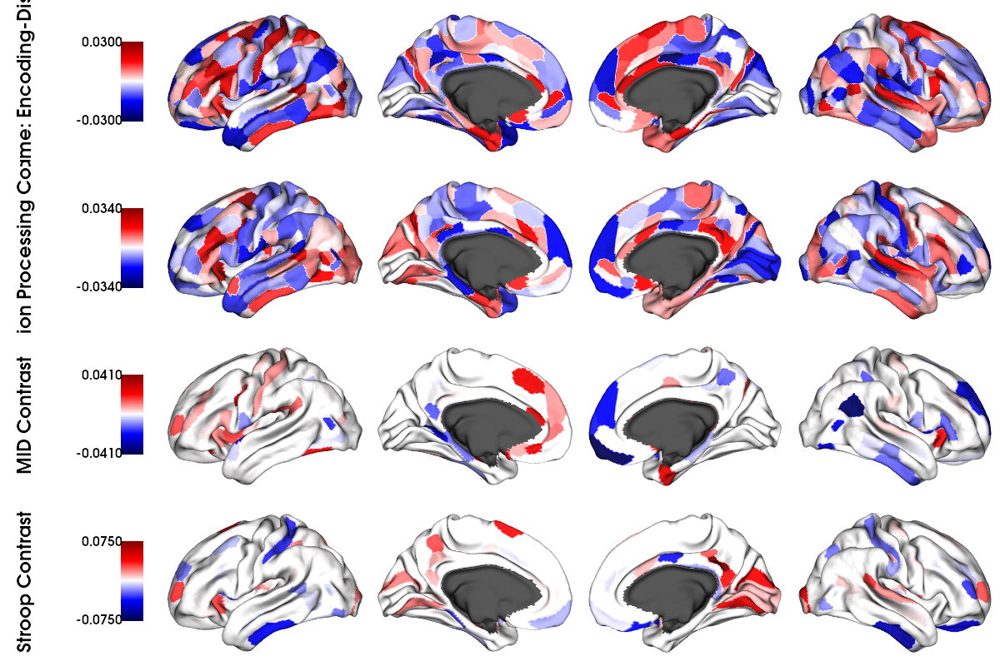

In [22]:
# First load the Glasser annotation file
file_url='https://raw.githubusercontent.com/rcruces/2020_NMA_surface-plot/master/data/glasser_360_conte69.csv'
Glasser = np.loadtxt(urllib2.urlopen(file_url), dtype=int)

# and load the conte69 surfaces
surf_lh, surf_rh = load_conte69()


# Mask the 0-value ROI of the medial wall
mask = Glasser != 0

task_keys = ['facename', 'faces', 'mid', 'stroop']
task_keys_lab = ['Facename: Encoding-Distractor',
                 'Emotion Processing Contrast',
                 'MID Contrast',
                 'Stroop Contrast',]
task = [None] * len(task_keys)

for i, tkey in enumerate(task_keys):
    # add a 0 entry that will match the medial wall index of the final array
    rho = np.concatenate((0, dct_elnet_coeff[tkey].mean()[:360].values), axis=None).round(3)
    # Map the vector values to the vertices indices
    rho_ver = map_to_labels(rho, Glasser, mask=mask,fill=np.nan)
    
    task[i] = rho_ver


# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=task,    # Vector of alues to plot
                 size=(1200, 200*len(task_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap='seismic',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range='sym',#(-0.13, 0.13),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),# Background color, default is white
                 label_text=task_keys_lab
                )



facename


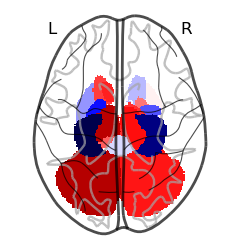

faces


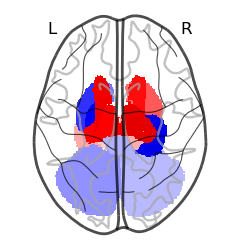

mid


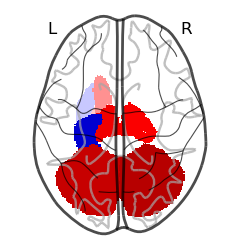

stroop


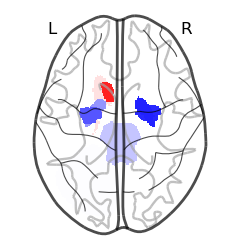

In [23]:
#plot task contrasts on one brain projection, subcortex only

#load atlases
wway = '/media/hcs-psy-narun/Alina/atlases/'
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat2 = atlas2.get_fdata()


for key in ['facename', 'faces', 'mid', 'stroop']: #contrasts only
    #empty image in the same way as reffered atlas
    site_nii2 = np.zeros(par_dat2.shape)
    #dataframe to plot
    data = dct_elnet_coeff[key]   
    
    #subcortex, the table has same order as atlas
    vec2 = pd.Series((data.mean()[360:]).values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )

    for index, numb in zip(vec2.index, vec2.iloc[:]): 
        site_nii2[par_dat2 == (index)] = numb
    
    #create image object
    site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
    
    #display
    print(key)
    display2 = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='seismic',       
                                         colorbar=False, display_mode='z', 
                                         #vmin=min(data.mean()),
                                         #cbar_tick_format = '%.2f',
                                         vmax=round(max(max(data.mean()), abs(min(data.mean()))), 4),
                                         symmetric_cbar=True
                                        )
    
    #plt.savefig(path_img_out+'feat_single_task_subc_'+key+'_plot_image.svg',bbox_inches='tight')
    
    plotting.show()

##### Structural mri

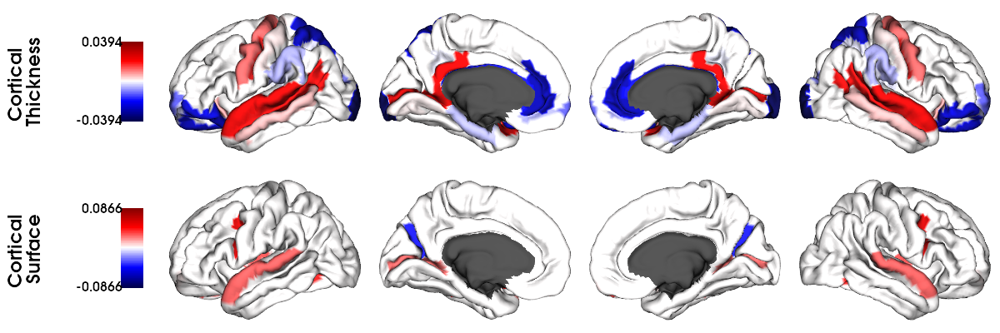

In [39]:
# Fetch surface atlas
destrx = datasets.fetch_atlas_surf_destrieux()

# Load fsaverage5 surfaces
surf_lh, surf_rh = load_fsa5()

# Remove non-cortex regions
regions = destrx['labels'].copy()
masked_regions = [b'Medial_wall', b'Unknown']
masked_labels = [regions.index(r) for r in masked_regions]
for r in masked_regions:
    regions.remove(r)

# Build Destrieux parcellation and mask
labeling = np.concatenate([destrx['map_left'], destrx['map_right']])
mask_destrx = ~np.isin(labeling, masked_labels)


# Map gradients to original parcels
anat_keys = ['cort', 'surf']
anat_keys_lab = ['Cortical \nThickness', 
                 'Cortical \nSurface']
anat = [None] * len(anat_keys)
for i, akey in enumerate(anat_keys):
    rho = map_to_labels(dct_elnet_coeff[akey].mean().values, labeling, mask=mask_destrx, fill=np.nan)
    
    anat[i] = rho

plot_hemispheres(surf_lh, surf_rh, 
                 array_name=anat, 
                 size=(1200, 200*len(anat_keys)), 
                 cmap='seismic',
                 color_bar='left', 
                 zoom=1.5,
                 embed_nb=True,         
                 interactive=False,
                 #share='both',
                 color_range='sym',#(-0.1, 0.1),       # color range
                 nan_color=(0.25, 0.25, 0.25, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),
                 label_text=anat_keys_lab
                )

subc


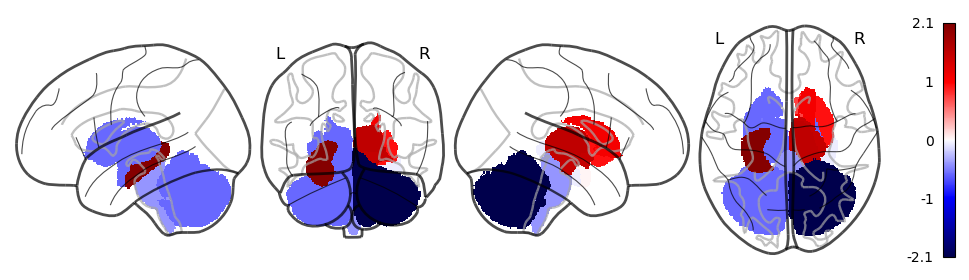

In [24]:
#plot anatomical cortical and subcortical feature importance (from FreeSurfer, Destrieux atlas)
wway = '/media/hcs-psy-narun/Alina/atlases/'
#load atlases
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')



    
#subcortex

#empty image in the same way as reffered atlas
par_dat2 = atlas2.get_fdata()
site_nii2 = np.zeros(par_dat2.shape)
#reorder subc table into atlas order
dtvc = dct_elnet_coeff['subc']
#std
dtvc = pd.DataFrame(StandardScaler().fit_transform(dtvc.T.values),
                    index=dtvc.T.index, columns=dtvc.T.columns).T
v2 = dtvc.mean()
vec2 =pd.Series(v2.values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )
#fill mat with numbers
for index, numb in zip(vec2.index, vec2.iloc[:]): 
    site_nii2[par_dat2 == (index)] = numb
#create image object
site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
#display
print('subc')
display_subc = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap='seismic',  #different colormap
                                         colorbar=True, display_mode='lyrz', 
                                         symmetric_cbar=True)

plt.savefig(path_img_out+'feat_single_struct_subc_plot_image.svg',bbox_inches='tight')

plotting.show()

In [25]:
dct_elnet_coeff['brainVol'].columns

Index(['eTIV', 'CortexVol', 'SubCortGrayVol', 'CerebralWhiteMatterVol',
       'BrainSegVol-to-eTIV'],
      dtype='object')

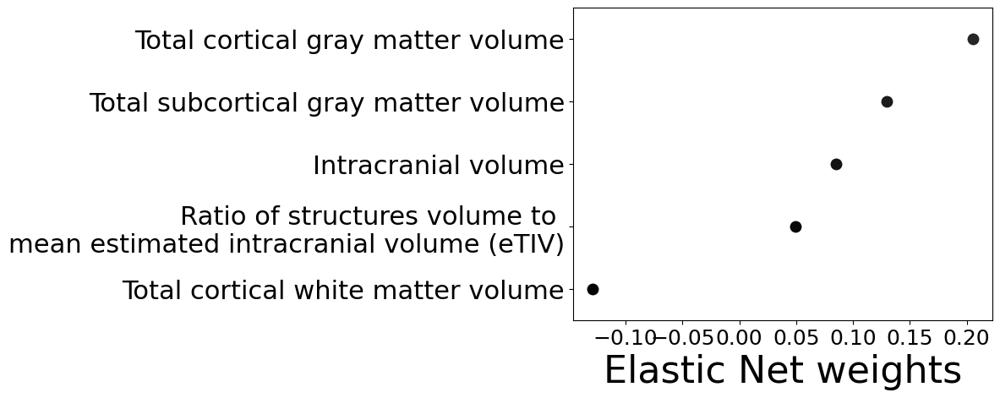

In [26]:
#Total Brain Volume

data = dct_elnet_coeff['brainVol']
data.columns = ['Intracranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = data.loc[:, data.mean().sort_values(ascending=False).index]
data.T.to_csv(path2+'TBV_plot_numbers.csv')
#sns.boxplot(data=data, orient="h", color='tab:blue')
sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'feat_single_TotalVolume_plot_image.svg',bbox_inches='tight')

plt.show()

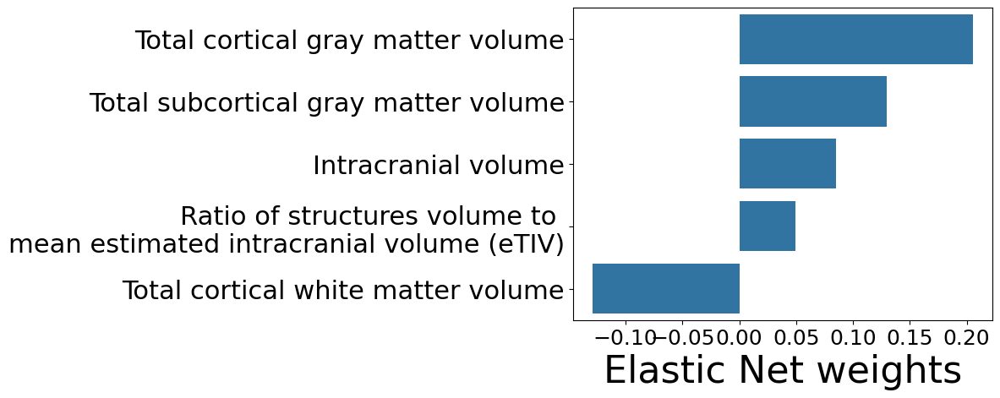

In [27]:
#Total Brain Volume

data = dct_elnet_coeff['brainVol']
data.columns = ['Intracranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = data.loc[:, data.mean().sort_values(ascending=False).index]
data.T.to_csv(path2+'TBV_plot_numbers.csv')
#sns.boxplot(data=data, orient="h", color='tab:blue')
sns.barplot(data=data, orient="h", color='tab:blue')
#sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'feat_single_TotalVolume_plot_image2.svg',bbox_inches='tight')

plt.show()

In [ ]:
#Total Brain Volume

data = dct_elnet_coeff['VolBrain']
data.columns = ['Intracranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = data.loc[:, data.mean().sort_values(ascending=False).index]
#data.T.to_csv(path2+'TBV_plot_numbers.csv')
sns.barplot(data=data, orient="h", color='tab:blue')
#sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
plt.xlim((-0.06,0.2))
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'feat_single_TotalVolume_plot_image2.svg',bbox_inches='tight')

plt.show()

#### Resting State and Tasks FC

In [44]:
#reorganize from pairs of ROIs back to matrix format

dct_FC_mat = {}
for key in ['rest', 'facename_FC', 'faces_FC', 'mid_FC', 'stroop_FC']:
    #dataframe to convert
    data_i  = dct_elnet_FC_coeff[key]

    df_std_FC = pd.DataFrame()
    #standardize
    for indx in data_i.index:
        df_std_FC[indx] = pd.DataFrame(StandardScaler().fit_transform(data_i.loc[indx,:].values.reshape(-1, 1)), 
                                       index=data_i.loc[indx,:].index)[0]
    df_std_FC = df_std_FC.T
    
    #average across folds    
    data = df_std_FC.mean()

    #restore full matrix
    ind379 = np.triu_indices(379, k=1)
    mat379 = np.zeros((379,379),float)
    mat379[ind379]=data.values
    mat379_2 = pd.DataFrame(mat379).replace(0, np.nan)
    mat379_f = pd.DataFrame(np.where(mat379,mat379_2,mat379_2.T))
    mat379_f.index = ind_task
    mat379_f.columns = ind_task
    
    #save mat to dct
    dct_FC_mat[key] = mat379_f

In [45]:
glanets = pd.read_csv('/media/hcs-psy-narun/Alina/atlases/Glasser-Cole_match_table.txt')

In [46]:
tab_subc = pd.DataFrame({'orig_order':np.arange(361,380,1),
                         'left_first_order':np.arange(361,380,1),
                         'Cole_net_order':np.full(19,13),
                         'name_Glasser':ind_task[-19:],
                         'Cole_net_name':np.full(19,'Subcortex')
                         }, index=np.arange(360,379,1))

In [47]:
glanets = pd.concat([glanets,tab_subc], axis=0)

In [48]:
vec = []
vec_nms = []
k=0
for i in sorted(set(glanets['Cole_net_order'])):
    #print(i)
    display()
    k+= int(len(glanets[glanets['Cole_net_order']==i].index))
    vec+=[k]
    nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
    vec_nms+= [nms]

In [49]:
# min and max for each modality
for key in ['rest', 'facename_FC', 'faces_FC', 'mid_FC', 'stroop_FC']:
    print(key)
    print('max', dct_FC_mat[key].max().max())
    print('min', dct_FC_mat[key].min().min())

rest
max 4.011235353751516
min -4.499695455914155
facename_FC
max 4.300702263532963
min -4.437012976661075
faces_FC
max 4.466512773621134
min -4.027987119570543
mid_FC
max 4.745411763517905
min -4.609959928356821
stroop_FC
max 4.384713655181353
min -4.265346597866892


rest


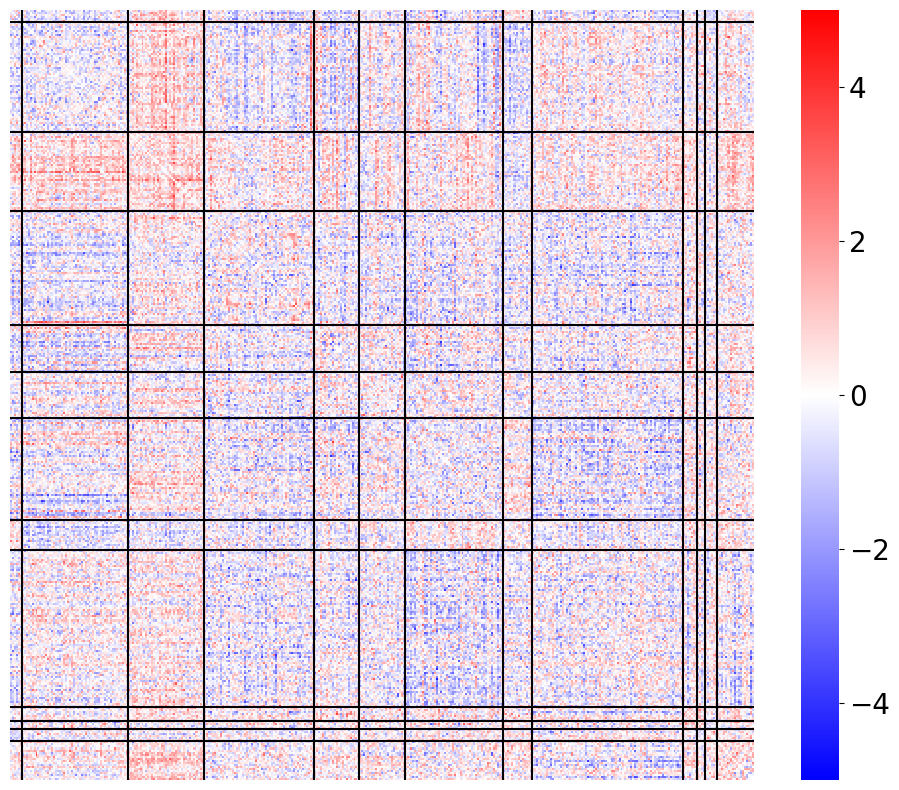

facename_FC


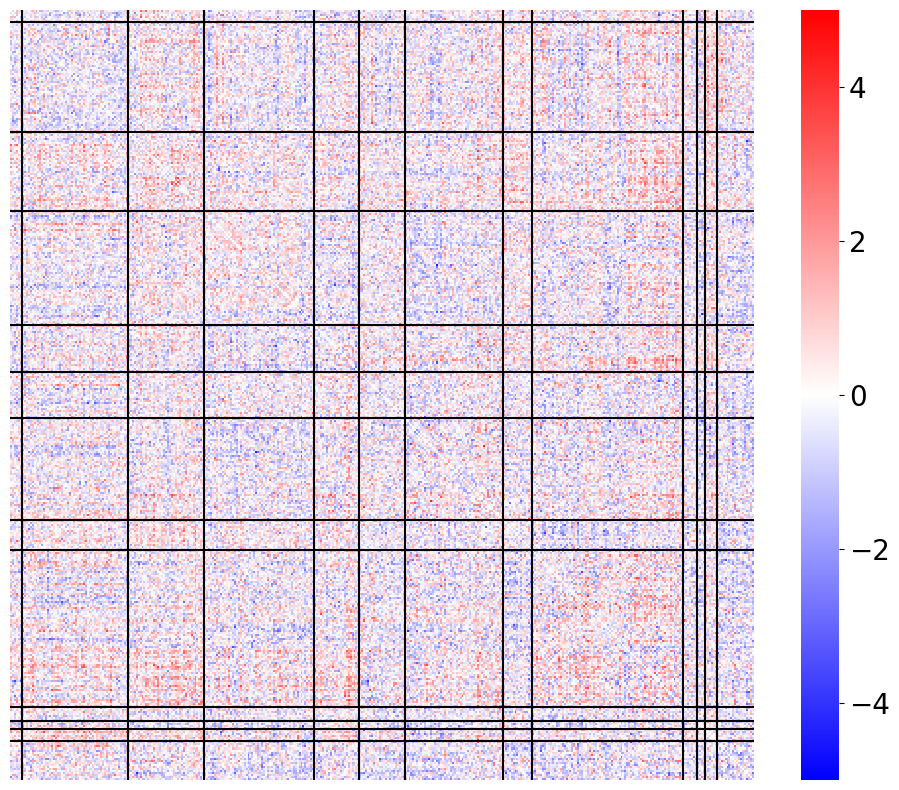

faces_FC


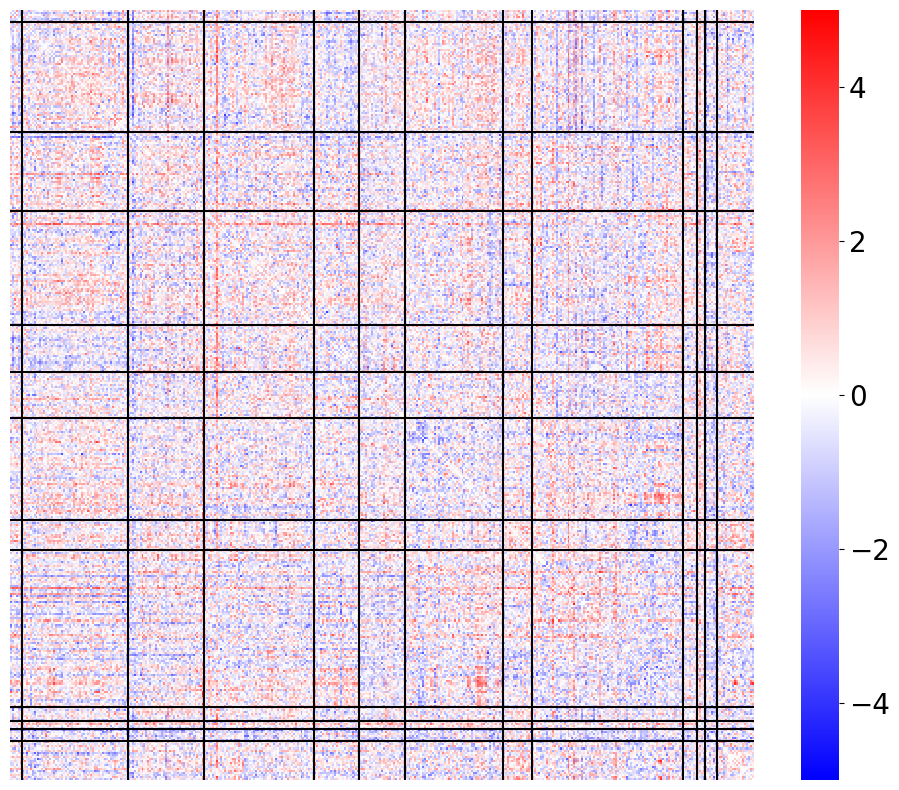

mid_FC


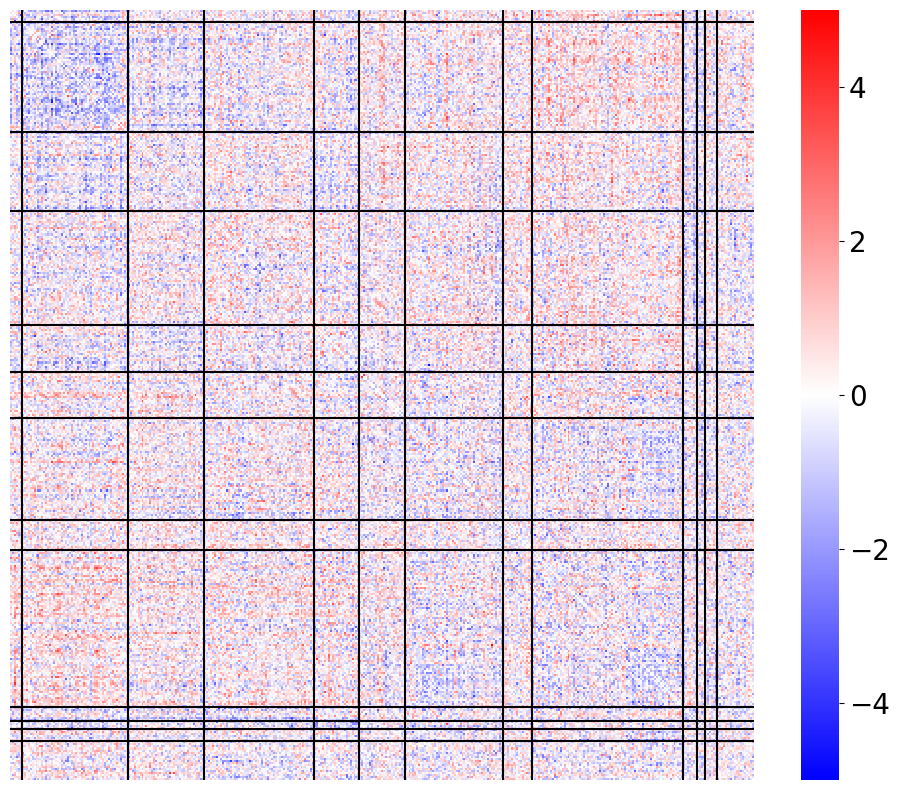

stroop_FC


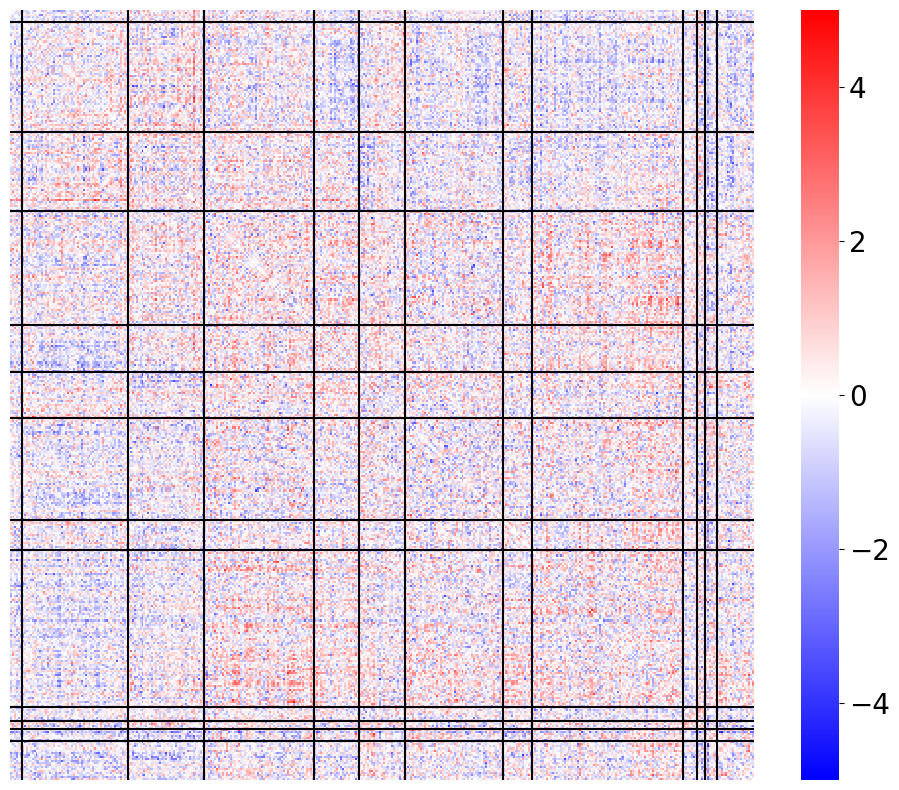

In [50]:
for key in ['rest', 'facename_FC', 'faces_FC', 'mid_FC', 'stroop_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[key].reindex(index=indx, columns=indx)

    fig= plt.figure(figsize=(12,10))

    ax =sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5)
    plt.xticks([])
    plt.yticks([])

    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]

    for k in vec[:-1]:
        plt.axvline(x=k, color='black')
        plt.axhline(y=k, color='black')

    # use matplotlib.colorbar.Colorbar object
    cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=20)

    plt.savefig(path_img_out+'FI_Brain_NoAdj_FCs_'+key+'_1_plot_image.svg',bbox_inches='tight')

    plt.show()

rest


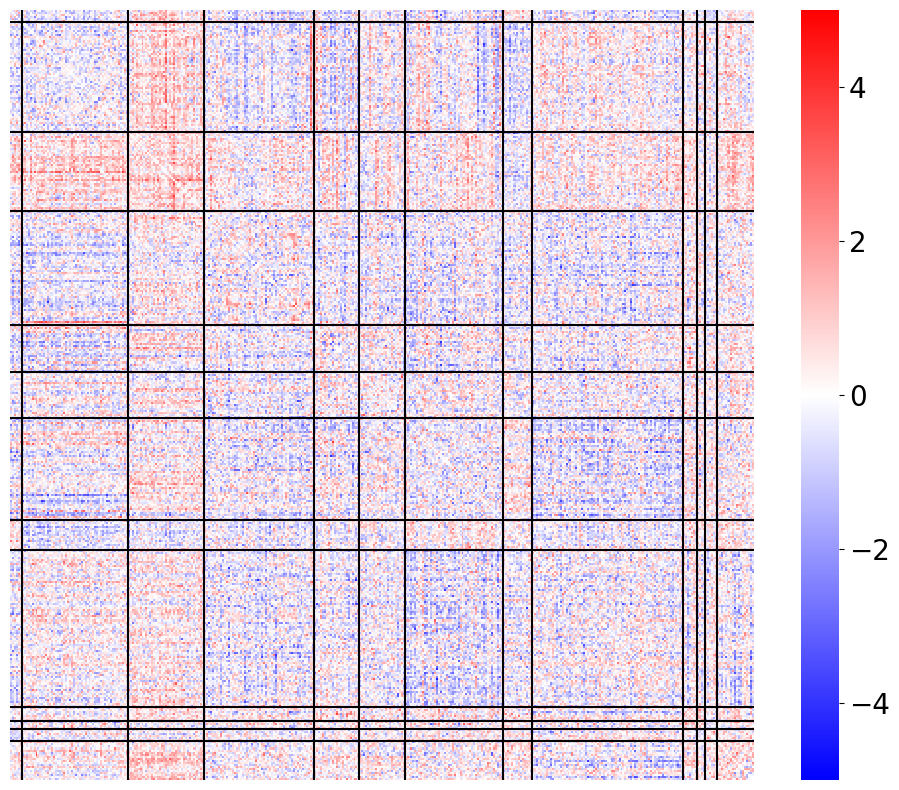

facename_FC


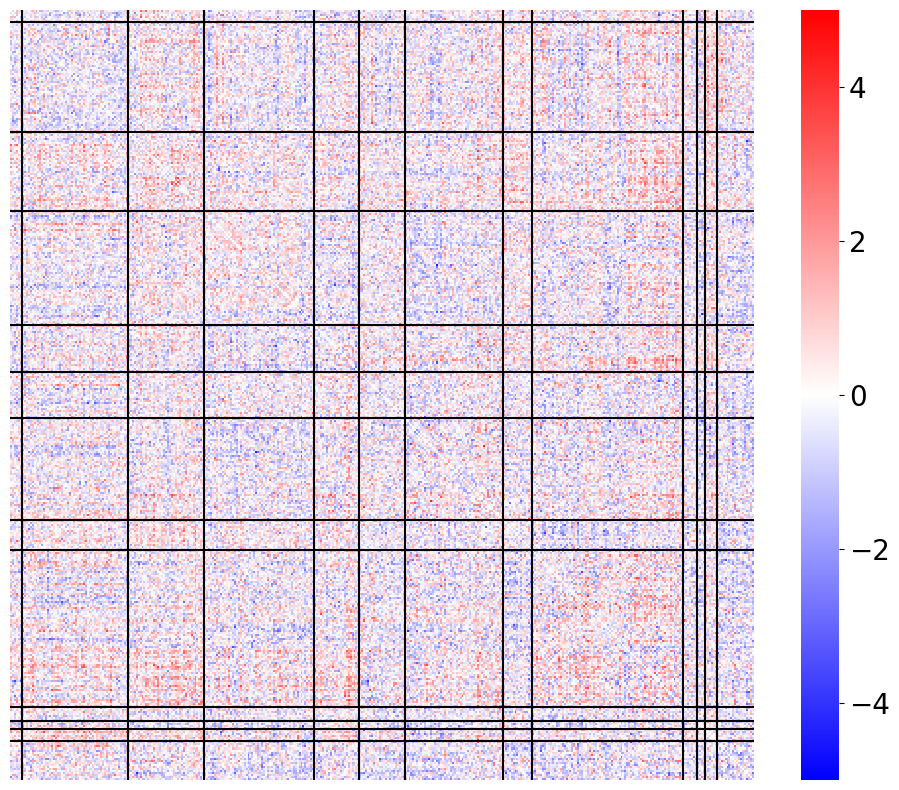

faces_FC


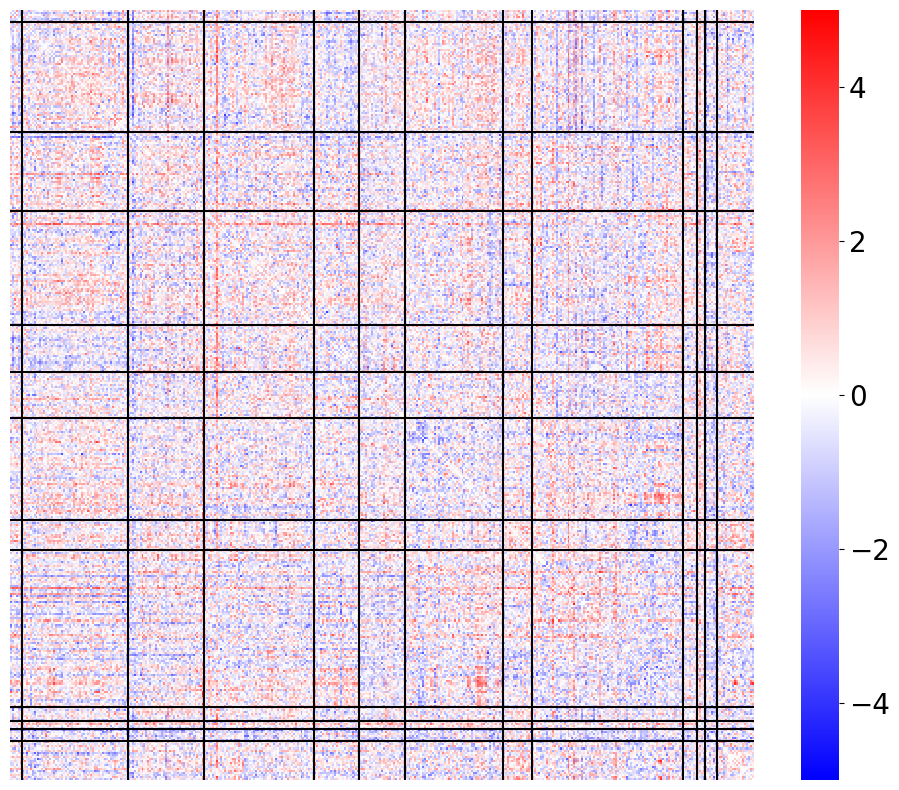

mid_FC


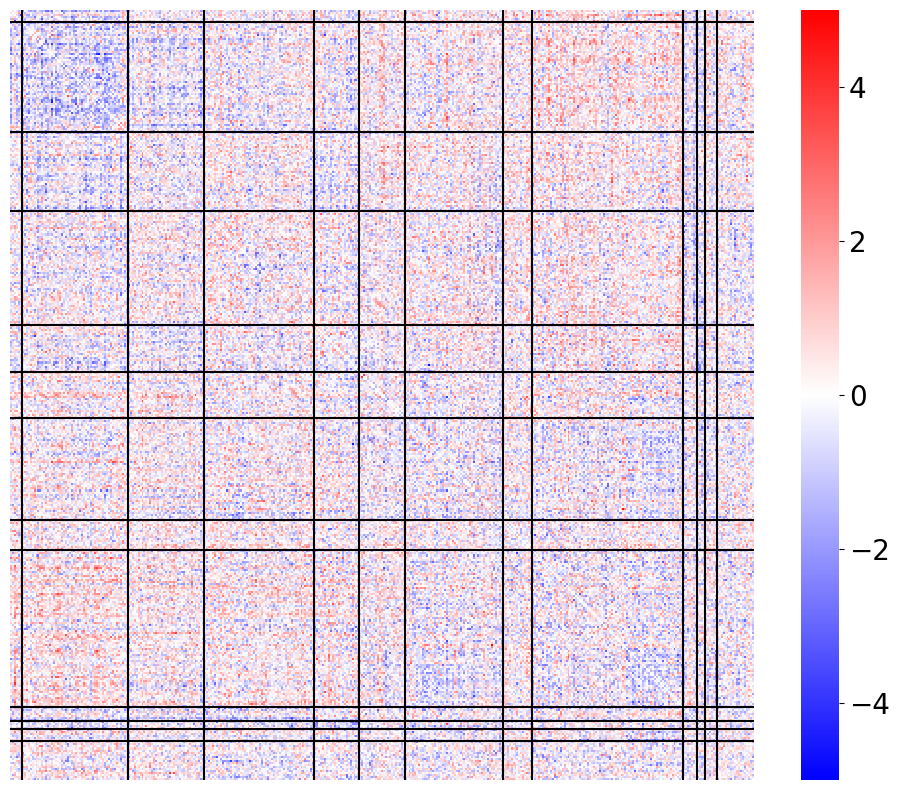

stroop_FC


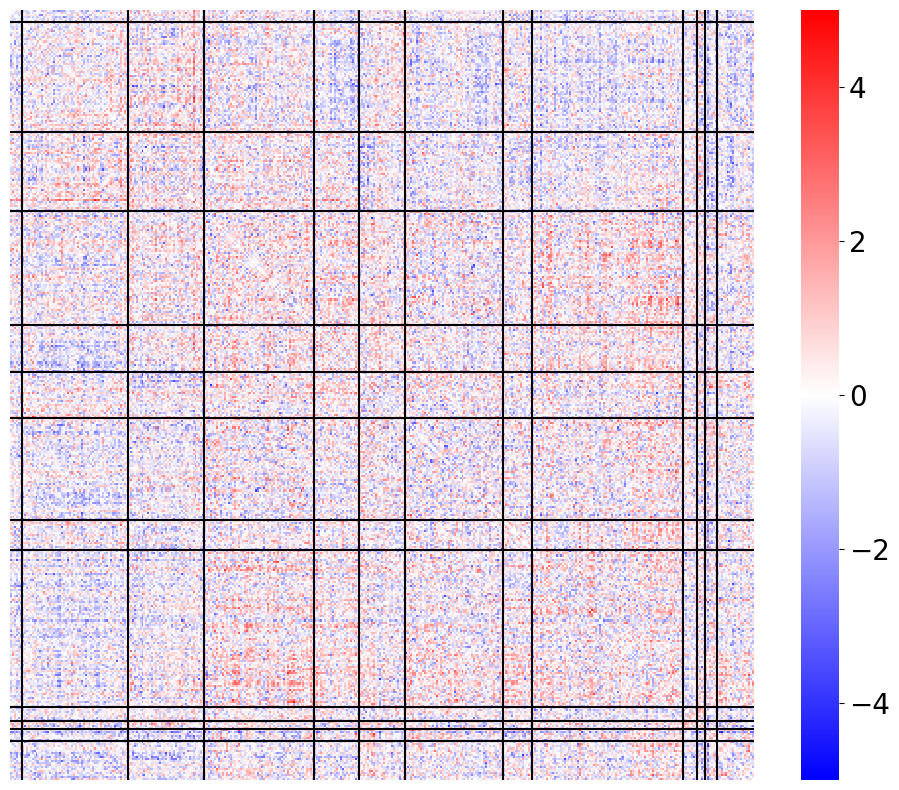

In [51]:
for key in ['rest', 'facename_FC', 'faces_FC', 'mid_FC', 'stroop_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[key].reindex(index=indx, columns=indx)

    fig= plt.figure(figsize=(12,10))

    ax =sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5)
    plt.xticks([])
    plt.yticks([])

    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]

    for k in vec[:-1]:
        plt.axvline(x=k, color='black')
        plt.axhline(y=k, color='black')

    # use matplotlib.colorbar.Colorbar object
    cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=20)

    plt.savefig(path_img_out+'FI2_Brain_NoAdj_FCs_'+key+'_1_plot_image.png',bbox_inches='tight')

    plt.show()

rest


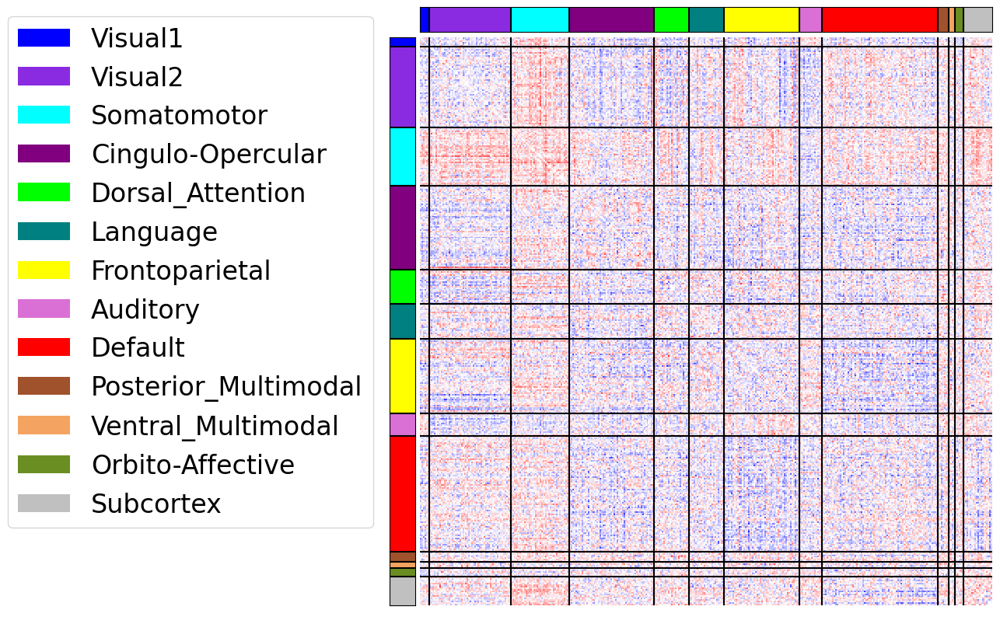

facename_FC


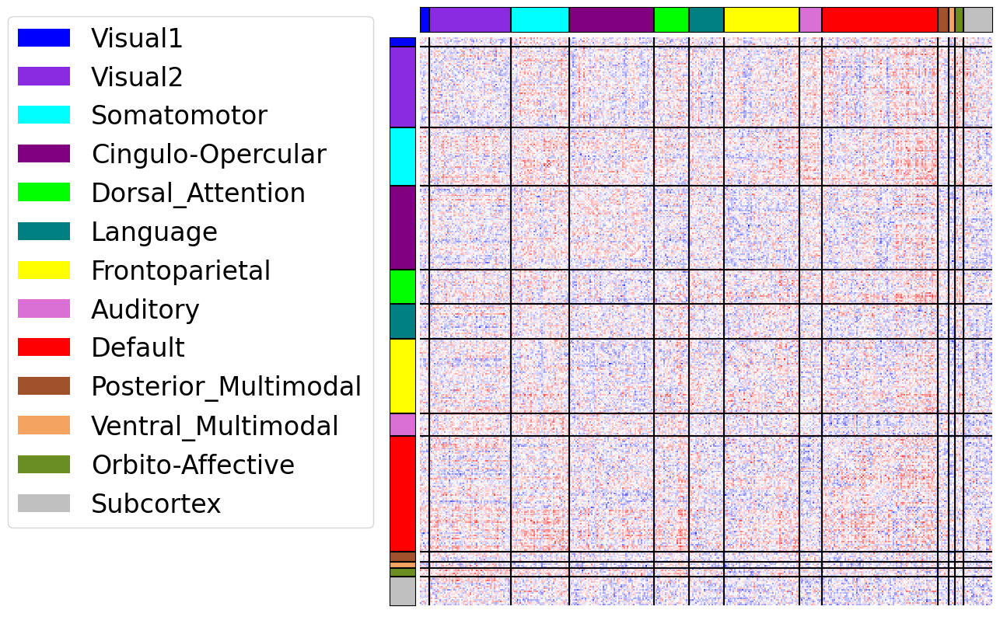

faces_FC


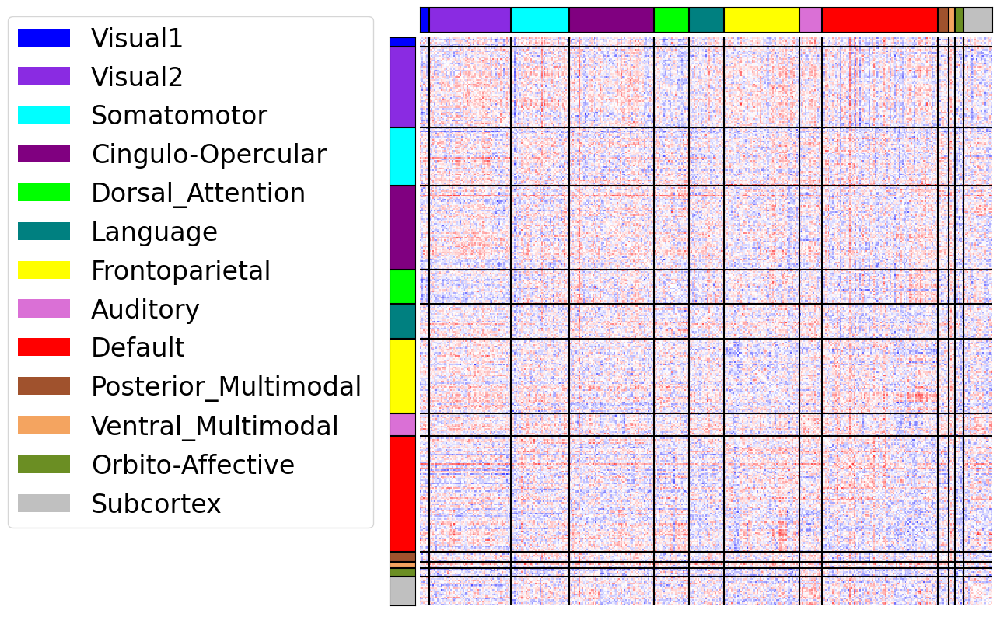

mid_FC


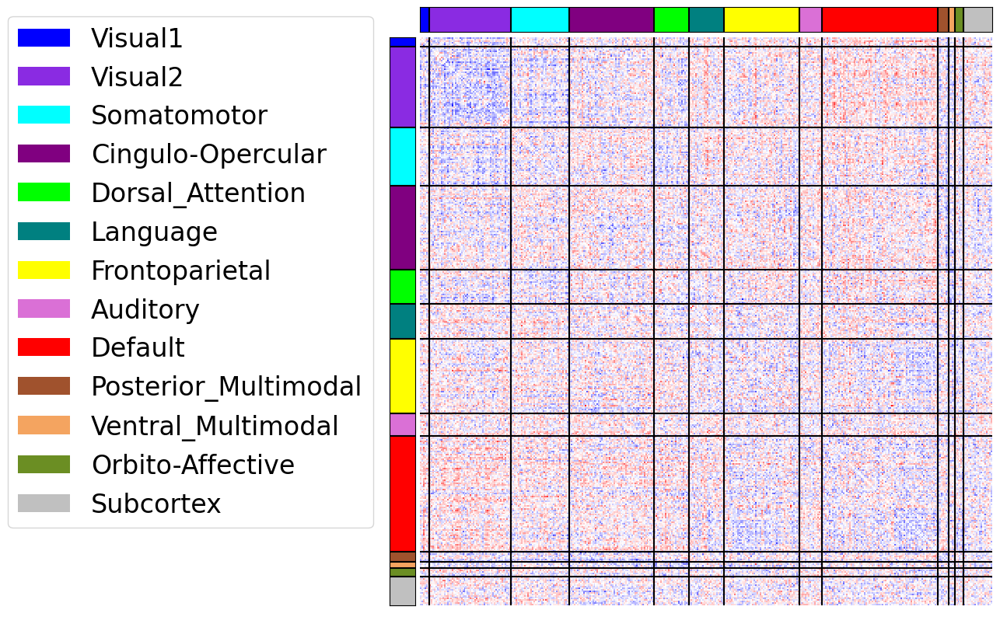

stroop_FC


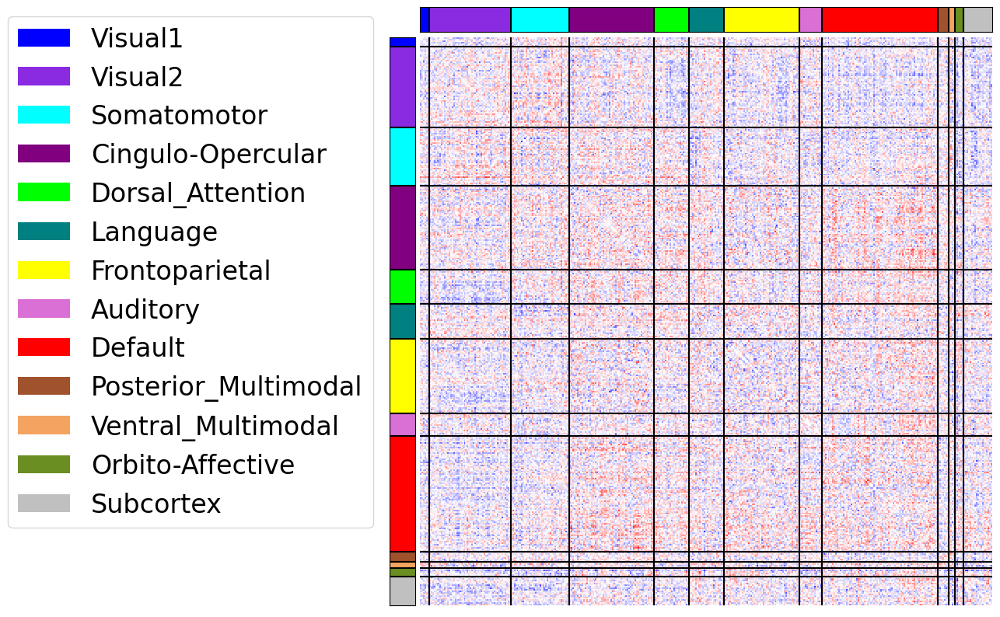

In [52]:
for key in ['rest', 'facename_FC', 'faces_FC', 'mid_FC', 'stroop_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='black')
        ax3.axhline(y=k, color='black')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])

    plt.savefig(path_img_out+'FI_Brain_NoAdj_FCs_'+key+'_2_plot_image.svg',bbox_inches='tight')

    plt.show()

rest


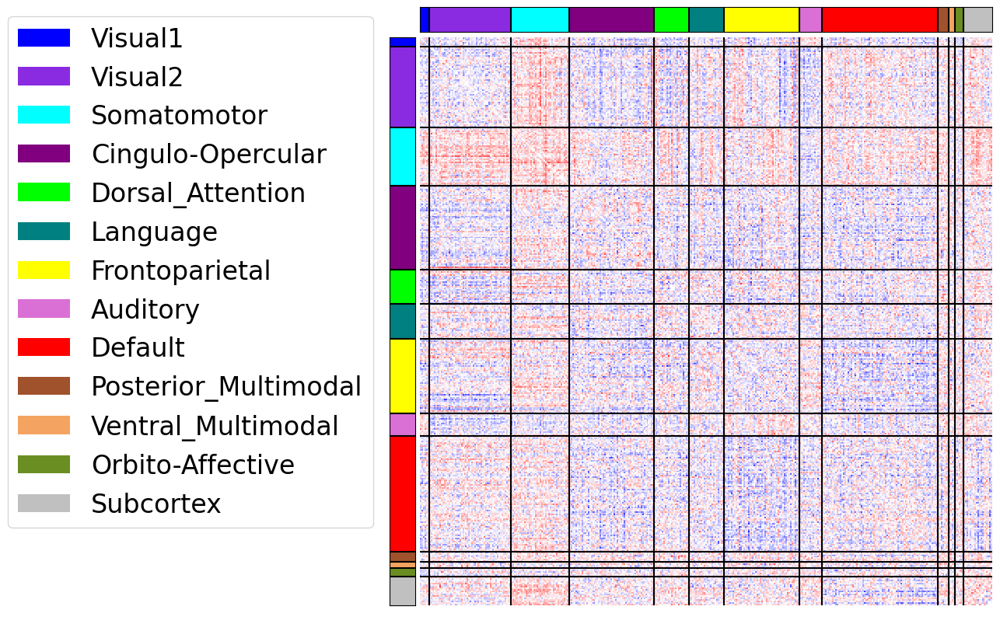

facename_FC


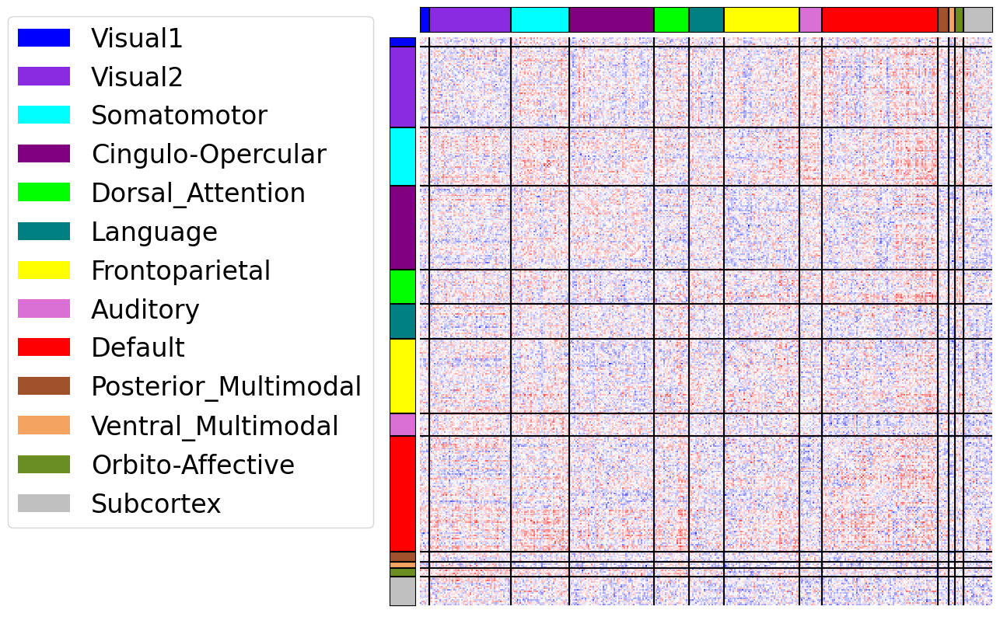

faces_FC


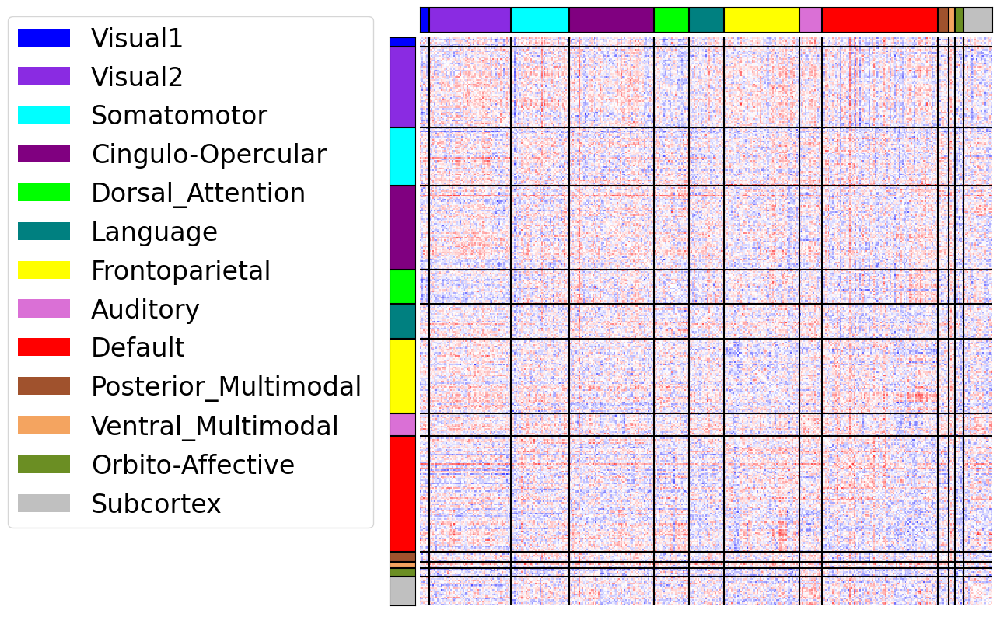

mid_FC


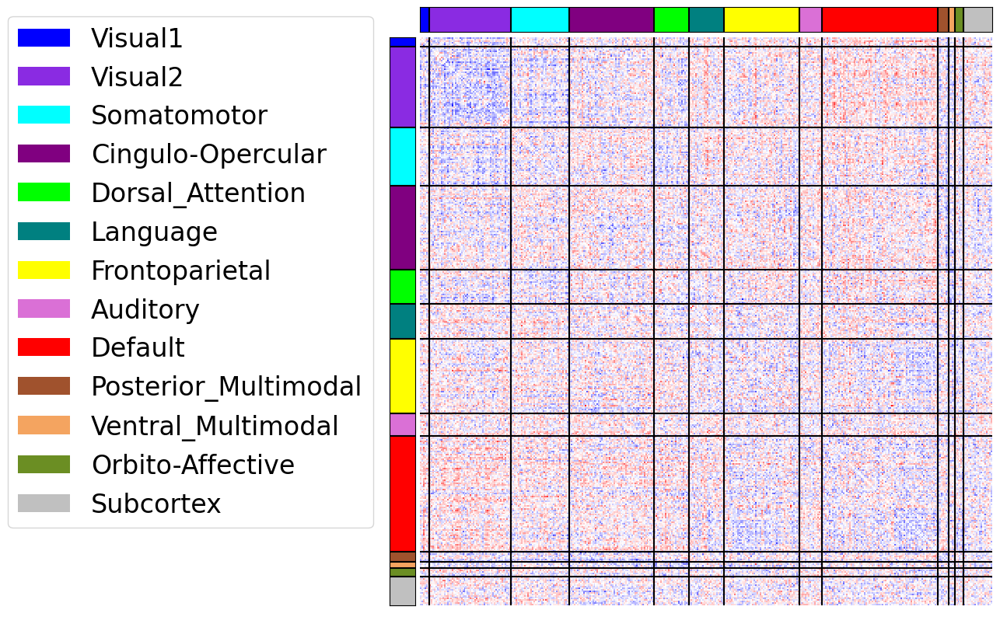

stroop_FC


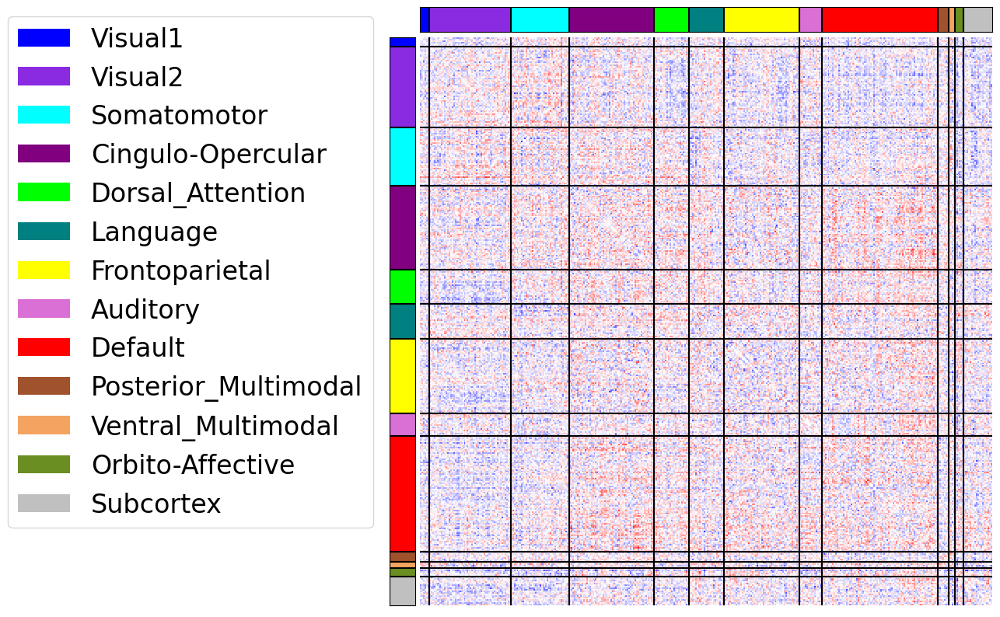

In [53]:
for key in ['rest', 'facename_FC', 'faces_FC', 'mid_FC', 'stroop_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='black')
        ax3.axhline(y=k, color='black')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='bwr',vmin=-5, vmax=5,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])

    plt.savefig(path_img_out+'FI2_Brain_NoAdj_FCs_'+key+'_2_plot_image.png',bbox_inches='tight')

    plt.show()

In [54]:
#mean feature importance for Cole nets within each FC modality

for key in ['rest', 'facename_FC', 'faces_FC', 'mid_FC', 'stroop_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)
    
    net_icc = {}
    for i in sorted(set(glanets['Cole_net_name'])):
        indxs = glanets[glanets['Cole_net_name']==i]['name_Glasser'].values
        df= data.reindex(index=indxs, columns=indxs)
        df = df.where(np.triu(np.ones(df.shape)).astype(np.bool))
        df = df.stack().reset_index()
        df.columns = ['Row','Column','Value']
        net_icc[i] = df['Value'].mean()
    net_icc = pd.Series(net_icc)
    #print(key)
    display(net_icc.sort_values(ascending=False))

rest


Ventral_Multimodal      0.851890
Somatomotor             0.765054
Posterior_Multimodal    0.700178
Orbito-Affective        0.577088
Subcortex               0.566668
Auditory                0.196508
Dorsal_Attention        0.097587
Language                0.076325
Cingulo-Opercular       0.025207
Default                -0.039028
Visual1                -0.061818
Frontoparietal         -0.149616
Visual2                -0.178330
dtype: float64

facename_FC


Somatomotor             0.344193
Default                 0.231346
Frontoparietal          0.050951
Cingulo-Opercular       0.042269
Visual1                 0.033403
Auditory               -0.039948
Language               -0.101904
Dorsal_Attention       -0.122635
Visual2                -0.183518
Posterior_Multimodal   -0.233043
Orbito-Affective       -0.265760
Ventral_Multimodal     -0.282105
Subcortex              -0.515656
dtype: float64

faces_FC


Auditory                0.551974
Visual2                 0.237359
Cingulo-Opercular       0.176224
Subcortex               0.145612
Somatomotor             0.071975
Posterior_Multimodal   -0.014047
Language               -0.062622
Default                -0.071126
Dorsal_Attention       -0.252856
Frontoparietal         -0.256229
Ventral_Multimodal     -0.364831
Visual1                -0.366118
Orbito-Affective       -0.987215
dtype: float64

mid_FC


Cingulo-Opercular       0.110763
Language               -0.004924
Subcortex              -0.023253
Auditory               -0.026530
Somatomotor            -0.063045
Dorsal_Attention       -0.103556
Frontoparietal         -0.142719
Visual1                -0.166445
Default                -0.199943
Orbito-Affective       -0.489736
Visual2                -0.667806
Ventral_Multimodal     -0.729645
Posterior_Multimodal   -0.921508
dtype: float64

stroop_FC


Orbito-Affective        0.518848
Ventral_Multimodal      0.332263
Dorsal_Attention        0.290069
Auditory                0.222793
Cingulo-Opercular       0.213172
Default                 0.166409
Somatomotor             0.078369
Visual2                 0.069519
Posterior_Multimodal   -0.067202
Frontoparietal         -0.078716
Subcortex              -0.079708
Language               -0.107847
Visual1                -0.333091
dtype: float64